In [2]:
import numpy as np
import pandas as pd
ApparelData = pd.read_csv('apparel-trainval.csv',sep=',',index_col = False)
train = ApparelData.sample(frac = 0.8)
val = ApparelData.loc[~ApparelData.index.isin(train.index)]

In [3]:
EncodedLabel = {}
EncodedLabel[0]='T-shirt/top'
EncodedLabel[1]='Trouser'
EncodedLabel[2]='Pullover'
EncodedLabel[3]='Dress'
EncodedLabel[4]='Coat'
EncodedLabel[5]='Sandal'
EncodedLabel[6]='Shirt'
EncodedLabel[7]='Sneaker'
EncodedLabel[8]='Bag'
EncodedLabel[9]='Ankle boot'

In [1]:
inputeLayerSize = 784
hiddenLayerSize = 10
outputLayerSize = 10
numOfHiddenLayers = 5
#initialize weights and biases 
Weights ={}
Biases ={}
hiddenLayerSizes1 = [30,20,15]
numOfHiddenLayers = len(hiddenLayerSizes1)

for i in range(0,len(hiddenLayerSizes1)):
    if(i==0):        
        Weights[i] = np.random.uniform(size=(hiddenLayerSizes1[i],inputeLayerSize)) 
        Biases[i] = np.random.uniform(size=(hiddenLayerSizes1[i],1))
    else:
        Weights[i] = np.random.uniform(size=(hiddenLayerSizes1[i],hiddenLayerSizes1[i-1])) 
        Biases[i] = np.random.uniform(size=(hiddenLayerSizes1[i],1))    

Weights[numOfHiddenLayers] = np.random.uniform(size=(outputLayerSize,hiddenLayerSizes1[numOfHiddenLayers-1])) 
Biases[numOfHiddenLayers] = np.random.uniform(size=(outputLayerSize,1))

NameError: name 'np' is not defined

for i in range(0,len(hiddenLayerSizes1)):
    if(i==0):        
        Weights[i] = np.random.randn(hiddenLayerSizes1[i],inputeLayerSize)
        Biases[i] = np.random.randn(hiddenLayerSizes1[i],1)
    else:
        Weights[i] = np.random.randn(hiddenLayerSizes1[i],hiddenLayerSizes1[i-1])
        Biases[i] = np.random.randn(hiddenLayerSizes1[i],1)

Weights[numOfHiddenLayers] = np.random.randn(outputLayerSize,hiddenLayerSizes1[numOfHiddenLayers-1])
Biases[numOfHiddenLayers] = np.random.randn(outputLayerSize,1)

for i in range(0,numOfHiddenLayers):
    if(i==0):        
        Weights[i] = np.random.uniform(size=(hiddenLayerSize,inputeLayerSize)) 
        Biases[i] = np.random.uniform(size=(hiddenLayerSize,1))
    #elif(i==numOfHiddenLayers):
        #Weights[i] = np.random.uniform(size=(outputLayerSize,hiddenLayerSize)) 
        #Biases[i] = np.random.uniform(size=(outputLayerSize,1))
    else:
        Weights[i] = np.random.uniform(size=(hiddenLayerSize,hiddenLayerSize)) 
        Biases[i] = np.random.uniform(size=(hiddenLayerSize,1))    
Weights[numOfHiddenLayers] = np.random.uniform(size=(outputLayerSize,hiddenLayerSize)) 
Biases[numOfHiddenLayers] = np.random.uniform(size=(outputLayerSize,1))

((Weights[0]@Xmatrix.T)+Biases[0]).shape

for i in Weights:
    print(Weights[i].shape)

In [158]:
def getSigmoid(x):
    return 1/(1+np.exp(-x))
def getSigmoidDash(x):
    return getSigmoid(x)*(1-getSigmoid(x))

In [159]:
import pickle

In [11]:
pickle_in = open("dict.pickle","rb")
Weights = pickle.load(pickle_in)

In [ ]:
numOfEpochs = 200
batchSize = 240
Xmatrix = train.iloc[0+(j*batchSize):batchSize+(j*batchSize),1:].values 
Xmatrix = Xmatrix.astype(float)
Xmatrix -= np.mean(Xmatrix.astype(float),axis=0)
SdVector = np.std(Xmatrix.astype(float),axis=0)
SdVector = np.array([1.0 if x==0 else x for x in SdVector])
Xmatrix /= SdVector
#Yvector = train.iloc[0+(j*batchSize):batchSize+(j*batchSize),0].values
#print(Yvector.shape)
#print(str(0+(j*batchSize))+str(" - ")+str(480+(j*batchSize)))
#forward pass
z = {}
    #if(i==0):
        #print(Weights[i].shape)
        #print(Xmatrix.T.shape)
        #print((Weights[i]@(Xmatrix.T)).shape)
        #print(Biases[i].shape)
z[0] = (Weights[0]@Xmatrix.T)+Biases[0]
z[1]= (Weights[1]@(1./(1+np.exp(-1*z[0]))))+Biases[1]
#z[i] = (Weights[i]@(1./(1+np.exp(Xmatrix.T))))+Biases[i]
#print(i)
print(z[1].shape)
print((z[1][:,0:120] == z[1][:,120:240] ).all())
#print((z[1][:,0:2]))
#elif (i==numOfHiddenLayers):
#print(Weights[1][:,0:2])
print(z[0][:,0:2])
#print(z[0][0,2])
#print(1/(1+np.exp(-1*z[0][0,2])))

In [ ]:
numOfEpochs = 2400
batchSize = 20
for j in range(61,numOfEpochs):
    print("Epoch is "+str(j))
    Xmatrix = train.iloc[0+(j*batchSize):batchSize+(j*batchSize),1:].values    
    #Yvector = train.iloc[0+(j*batchSize):batchSize+(j*batchSize),0].values
    Xmatrix = Xmatrix.astype(float)
    Xmatrix -= np.mean(Xmatrix.astype(float),axis=0)
    SdVector = np.std(Xmatrix.astype(float),axis=0)
    SdVector = np.array([1.0 if x==0 else x for x in SdVector])
    Xmatrix /= SdVector
    #print(Yvector.shape)
    print(str(0+(j*batchSize))+str(" - ")+str(480+(j*batchSize)))
    #forward pass
    z = {}
    for i in range(0,numOfHiddenLayers+1):#np.reshape(a, (3,1))
        if(i==0):
            #print(Weights[i].shape)
            #print(Xmatrix.T.shape)
            #print((Weights[i]@(Xmatrix.T)).shape)
            #print(Biases[i].shape)
            z[i] = (Weights[i]@Xmatrix.T)+Biases[i]
            #z[i] = (Weights[i]@(1./(1+np.exp(Xmatrix.T))))+Biases[i]
            print(i)
            print(z[i].shape)
            print((z[i][:,0:2] == z[i][:,10:12] ).all())
        #elif (i==numOfHiddenLayers):
         #   z[i]= (Weights[i]@(-z[i-1]))))+Biases[i]            
        else:
            #print(Weights[i].shape)
            #print(((1./(1+np.exp(-z[i-1])))).shape)
            #print((Weights[i]@(((1./(1+np.exp(-z[i-1])))))).shape)
            #print(Biases[i].shape)
            #calculating the present layer z by 
            #if method == sigmoid:
            z[i]= (Weights[i]@(1./(1+np.exp(-1*z[i-1]))))+Biases[i]
            print((z[i][:,0:2] == z[i][:,10:12] ).all())
            #print(i)
            #print(z[i].shape)
    #finding outputs using softmax
    z[-1] = Xmatrix.T
    Yhat = (np.exp(z[numOfHiddenLayers]))/(np.sum(np.exp(z[numOfHiddenLayers]), axis=0)[None,:])
    #Yhat = np.log(Yhat)   
    #YvectorModified = np.zeros((Yhat.shape[0],Yhat.shape[1]))
    UniqueLabels=np.array([0,1,2,3,4,5,6,7,8,9])
    #creating indicator vectors
    YvectorModified = (Yvector[:,None]==UniqueLabels).astype(int).T
    #print(Yvector)
    #print(YvectorModified)
    #calculating the cost using cross-entropy
    #Cost = np.sum(-1*YvectorModified*Yhat)
    Cost = np.sum(-1*YvectorModified*np.log(Yhat))#/batchSize
    print(Cost)
    #Yhat = (np.exp(z[numOfHiddenLayers]))/(np.sum(np.exp(z[numOfHiddenLayers]), axis=0)[None,:])
    
    GradWeights = {}
    GradBiases = {}
    
    GradWeights[0] = np.zeros((hiddenLayerSizes1[0],inputeLayerSize)) 
    GradBiases[0] = np.zeros((hiddenLayerSizes1[0],1)) 
    
    #for temp1 in range(numOfHiddenLayers-1,-1,-1):
    for temp1 in range(numOfHiddenLayers-1,0,-1):
        GradWeights[temp1] = np.zeros((hiddenLayerSizes1[temp1],hiddenLayerSizes1[temp1-1])) 
        GradBiases[temp1] = np.zeros((hiddenLayerSizes1[temp1],1)) 
        
    GradWeights[numOfHiddenLayers] = np.zeros((outputLayerSize,hiddenLayerSizes1[numOfHiddenLayers-1]))
    GradBiases[numOfHiddenLayers] = np.zeros((outputLayerSize,1))
    
    #DcostDAct = {}
    #for temp1 in range(0,numOfHiddenLayers):
     #       DcostDAct[temp1] = np.zeros((hiddenLayerSize,batchSize)) 
    #DcostDAct[numOfHiddenLayers] = np.zeros((outputLayerSize,batchSize))
    
    #DcostDAct[numOfHiddenLayers] = (YvectorModified/Yhat)
    
    #DcostDAct[numOfHiddenLayers-1] = 
    
    
    #for temp3 in range(numOfHiddenLayers-1,-1,-1):
     #   for temp4 in range(0,DcostDAct[temp3].shape[0]):
      #      if(temp3==(numOfHiddenLayers-1)): 
       #         #tempsum1 = (Weights[temp3+1][:][temp4]* ((Yhat)*(1-Yhat))*DcostDAct[temp3+1]) 
                 #tempsum1 = (Weights[temp3+1][:,[temp4]]* (Yhat-YvectorModified))
        #        tempsum1= np.sum(tempsum1, axis=0)[None,:]
         #   else:
          #      #tempsum1 = (Weights[temp3+1][:][temp4]* getSigmoidDash(z[temp3+1])*DcostDAct[temp3+1]) 
                #tempsum1 = (Weights[temp3+1][:,[temp4]]* getSigmoidDash(z[temp3+1])*DcostDAct[temp3+1]) 
           #     tempsum1 = np.sum(tempsum1, axis=0)[None,:]
            #DcostDAct[temp3][[temp4],:] = tempsum1      
    
     #for indexj in range(0,Weights[numOfHiddenLayers].shape[0]): 
      #      for indexs in range(0,Weights[numOfHiddenLayers].shape[1]):
       #         GradWeights[numOfHiddenLayers] = (getSigmoid(z[numOfHiddenLayers-1].T)*(Yhat-YvectorModified))                               
        #    GradBiases[numOfHiddenLayers] = (Yhat-YvectorModified)#sum all columns and divide by 480
    
    
    
    for indexi in range(0,batchSize):
        #print("sample is "+str(indexi))
        DcostDAct = {}
        for temp1 in range(0,numOfHiddenLayers):
            DcostDAct[temp1] = np.zeros((hiddenLayerSizes1[temp1],1)) 
       # DcostDAct[numOfHiddenLayers] = np.zeros((outputLayerSize,1))
        
       # for temp2 in range(0,DcostDAct[numOfHiddenLayers].shape[0]):
        #    DcostDAct[numOfHiddenLayers][temp2] = (-YvectorModified[temp2][indexi]/Yhat[temp2][indexi])
        
        
        for temp4 in range(0,DcostDAct[numOfHiddenLayers-1].shape[0]):
                tempsum1 = 0
                for temp5 in range(0,outputLayerSize):
                        tempsum1+= (Weights[numOfHiddenLayers][temp5][temp4]* (Yhat[temp5][indexi]-YvectorModified[temp5][indexi]))            
                DcostDAct[numOfHiddenLayers-1][temp4] = tempsum1      
        
            
        for temp3 in range(numOfHiddenLayers-2,-1,-1):
            for temp4 in range(0,DcostDAct[temp3].shape[0]):
                tempsum1 = 0
                for temp5 in range(0,DcostDAct[temp3+1].shape[0]):
                    tempsum1+= (Weights[temp3+1][temp5][temp4]* getSigmoidDash(z[temp3+1][temp5][indexi])*DcostDAct[temp3+1][temp5]) 
                DcostDAct[temp3][temp4] = tempsum1
          
        for indexj in range(0,Weights[numOfHiddenLayers].shape[0]): 
            for indexs in range(0,Weights[numOfHiddenLayers].shape[1]):
                GradWeights[numOfHiddenLayers][indexj][indexs] += (getSigmoid(z[numOfHiddenLayers-1][indexs][indexi])*(Yhat[indexj][indexi]-YvectorModified[indexj][indexi]))                            
            GradBiases[numOfHiddenLayers][indexj] += (Yhat[indexj][indexi]-YvectorModified[indexj][indexi])
        for temp1 in range(numOfHiddenLayers-1,-1,-1):
            for indexj in range(0,Weights[temp1].shape[0]):
                for indexs in range(0,Weights[temp1].shape[1]):
                    GradWeights[temp1][indexj][indexs] += (getSigmoid(z[temp1-1][indexs][indexi])*getSigmoidDash(z[temp1][indexj][indexi])*DcostDAct[temp1][indexj])
                GradBiases[temp1][indexj] += (getSigmoidDash(z[temp1][indexj][indexi])*DcostDAct[temp1][indexj])
        
        
    #backwardprop
    #finding gradients and updating weights and biases
        #for temp6 in Weights:
            #Weights[temp6] += 0.0005*GradWeights[temp6]
        #for temp7 in Biases:
            #Biases[temp7] += 0.0005*GradBiases[temp7]
    for temp6 in Weights:
        Weights[temp6] -= 0.005*GradWeights[temp6]
    for temp7 in Biases:
        Biases[temp7] -= 0.005*GradBiases[temp7]
    if(j==160):
        break
    

Epoch is 61
1220 - 1700
0
(30, 20)
False
True
True
True
43.24730094059753
Epoch is 62
1240 - 1720
0
(30, 20)
False
False
False
False
43.23989397965367
Epoch is 63
1260 - 1740
0
(30, 20)
False
False
False
False
43.24348301006501
Epoch is 64
1280 - 1760
0
(30, 20)
False
False
False
False
43.23678941087104
Epoch is 65
1300 - 1780
0
(30, 20)
False
False
False
False
43.23689222461334
Epoch is 66
1320 - 1800
0
(30, 20)
False
False
False
False
43.24085630496312
Epoch is 67
1340 - 1820
0
(30, 20)
False
False
False
True
43.23381418108442
Epoch is 68
1360 - 1840
0
(30, 20)
False
False
False
False
43.236499028330115
Epoch is 69
1380 - 1860
0
(30, 20)
False
True
True
True
43.228536139548964
Epoch is 70
1400 - 1880
0
(30, 20)
False
False
False
False
43.22688261435626
Epoch is 71
1420 - 1900
0
(30, 20)
False
False
False
False
43.22892595956527
Epoch is 72
1440 - 1920
0
(30, 20)
False
True
True
True
43.225150760255666
Epoch is 73
1460 - 1940
0
(30, 20)
False
False
False
False
43.2238798306
Epoch is 7

In [ ]:
print(z[1])

In [252]:
import pickle

#example_dict = {1:"6",2:"2",3:"f"}

pickle_out = open("dict.pickle","wb")
pickle.dump(Weights, pickle_out)
pickle_out.close()

In [222]:
Weights

{0: array([[0.70411695, 0.61110835, 0.14165337, ..., 0.14977006, 0.73796091,
         0.76077303],
        [0.53083517, 0.22318739, 0.98862849, ..., 0.28628008, 0.94728875,
         0.62669621],
        [0.97988399, 0.936386  , 0.59911732, ..., 0.70289569, 0.63661469,
         0.70863911],
        ...,
        [0.77583892, 0.54292519, 0.87680385, ..., 0.23483898, 0.62395134,
         0.19509677],
        [0.95167212, 0.50396679, 0.45885745, ..., 0.71567375, 0.51887659,
         0.56394315],
        [0.83820048, 0.2633808 , 0.19157852, ..., 0.03878125, 0.12398725,
         0.85953298]]),
 1: array([[0.51132456, 0.27343487, 0.16242479, 0.66357191, 0.06017326,
         0.5496875 , 0.38987384, 0.84775217, 0.08367047, 0.53061667,
         0.38915784, 0.08741699, 0.90871673, 0.50340692, 0.10487995,
         0.77877202, 0.90286506, 0.26118004, 0.03349777, 0.27633723,
         0.007283  , 0.03064935, 0.42677389, 0.28216124, 0.27111846,
         0.73220555, 0.28114934, 0.0484409 , 0.21448196, 0

In [209]:
Weights


{0: array([[0.06880812, 0.04507191, 0.41648208, ..., 0.05853985, 0.31771716,
         0.46243334],
        [0.56752562, 0.61276537, 0.72248599, ..., 0.50400675, 0.32780485,
         0.15266082],
        [0.52675476, 0.48859413, 0.95404328, ..., 0.41496151, 0.72610811,
         0.71323227],
        ...,
        [0.3307709 , 0.50032868, 0.39949283, ..., 0.82107745, 0.81608652,
         0.92867754],
        [0.11684921, 0.39346546, 0.45387108, ..., 0.27021199, 0.7710957 ,
         0.17846424],
        [0.39426946, 0.39630914, 0.0987873 , ..., 0.05993263, 0.13321801,
         0.01560909]]),
 1: array([[0.89713386, 0.89846251, 0.79995234, ..., 0.94858494, 0.88420764,
         0.19780606],
        [0.72829426, 0.74576385, 0.7427728 , ..., 0.02265564, 0.67809842,
         0.8007086 ],
        [0.58560793, 0.88084022, 0.49535071, ..., 0.79389159, 0.82598698,
         0.27734721],
        ...,
        [0.51056129, 0.03664576, 0.65069234, ..., 0.11578584, 0.88817104,
         0.30569415],
      

In [241]:
ApparelTestData = pd.read_csv('apparel-test.csv',sep=',',index_col = False)

In [242]:
ApparelTestData.head()

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0,0,0,0,0,0,0,9,8,0,...,103,87,56,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,34,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,14,53,99,17,...,0,0,0,0,63,53,31,0,0,0
3,0,0,0,0,0,0,0,0,0,161,...,137,126,140,0,133,224,222,56,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [243]:
len(ApparelTestData)

9674

In [244]:
Xmatrix1 = ApparelTestData.values
Xmatrix1 = Xmatrix1.astype(float)
Xmatrix1 -= np.mean(Xmatrix1.astype(float),axis=0)
SdVector1 = np.std(Xmatrix1.astype(float),axis=0)
SdVector1 = np.array([1.0 if x==0 else x for x in SdVector])
Xmatrix1 /= SdVector1
z1 = {}
for i in range(0,numOfHiddenLayers+1):#np.reshape(a, (3,1))
    if(i==0):
        #print(Weights[i].shape)
        #print(Xmatrix.T.shape)
        #print((Weights[i]@(Xmatrix.T)).shape)
        #print(Biases[i].shape)
        z1[i] = (Weights[i]@Xmatrix1.T)+Biases[i]
        #z[i] = (Weights[i]@(1./(1+np.exp(Xmatrix.T))))+Biases[i]
        print(i)
        print(z1[i].shape)
    #elif (i==numOfHiddenLayers):
     #   z[i]= (Weights[i]@(-z[i-1]))))+Biases[i]            
    else:
        #print(Weights[i].shape)
        #print(((1./(1+np.exp(-z[i-1])))).shape)
        #print((Weights[i]@(((1./(1+np.exp(-z[i-1])))))).shape)
        #print(Biases[i].shape)
        #calculating the present layer z by 
        #if method == sigmoid:
        z1[i]= (Weights[i]@(1./(1+np.exp(-z1[i-1]))))+Biases[i]
        #print(i)
        #print(z[i].shape)
#finding outputs using softmax
z1[-1] = Xmatrix1.T
Yhat1 = (np.exp(z1[numOfHiddenLayers]))/(np.sum(np.exp(z1[numOfHiddenLayers]), axis=0)[None,:])

0
(30, 9674)


In [245]:
(Yhat1[:,12:16] == Yhat1[:,2:6] ).all()

False

In [246]:
Yhat1[:,[6]]
#(np.exp(z[5][:,[2]]))/(np.sum(np.exp(z[5][:,[6]]), axis=0)[None,:])

array([[0.1490718 ],
       [0.14891314],
       [0.09898173],
       [0.09898764],
       [0.00750703],
       [0.14927299],
       [0.09916339],
       [0.09893306],
       [0.0501541 ],
       [0.09901512]])

In [247]:
PredictedLabelsForTest = np.argmax(Yhat1, axis=0) 
Yhat1.shape

(10, 9674)

In [248]:
len(PredictedLabelsForTest)

9674

In [249]:
np.unique(PredictedLabelsForTest)

array([0, 5], dtype=int64)

In [250]:
ApparelTestData.insert(loc=0, column='labels', value=PredictedLabelsForTest)

In [15]:
a = np.array([[0, 1, 2, 3, 4],
       [5, 6, 7, 8, 9]])
np.argmax(a, axis=0)                                                                                                             


array([1, 1, 1, 1, 1], dtype=int64)

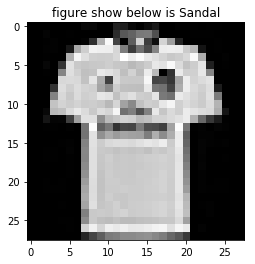

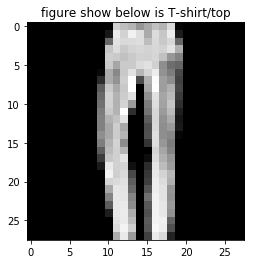

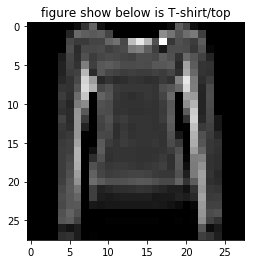

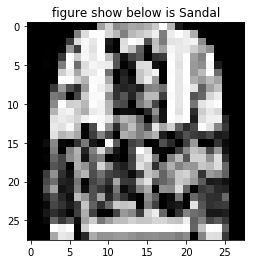

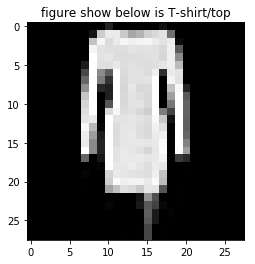

...

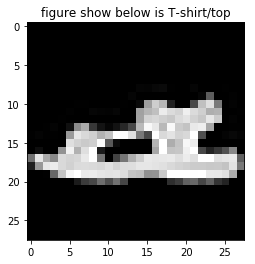

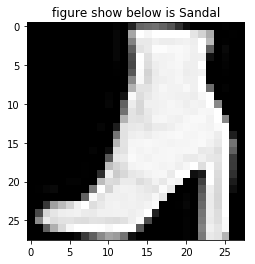

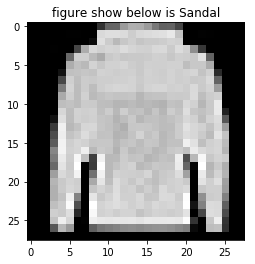

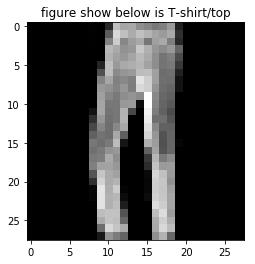

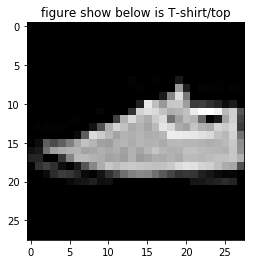

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\axis.py:1081: UserWarning: Unable to find pixel distance along axis for interval padding of ticks; assuming no interval padding needed.
  warnings.warn("Unable to find pixel distance along axis "


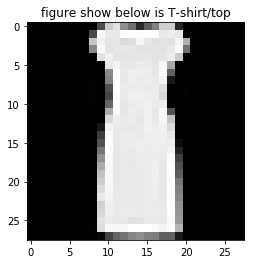

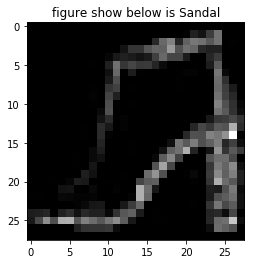

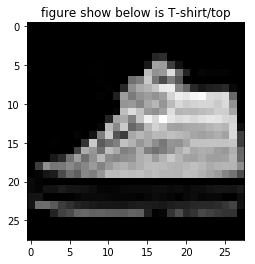

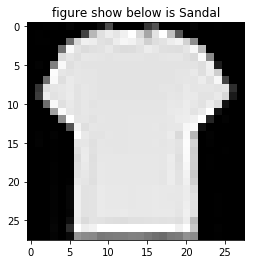

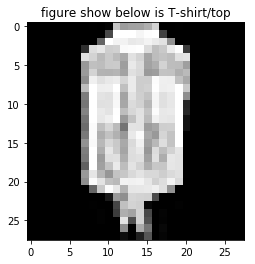

...

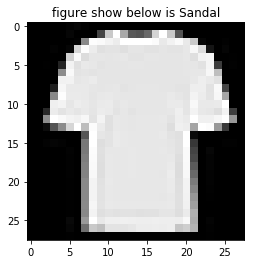

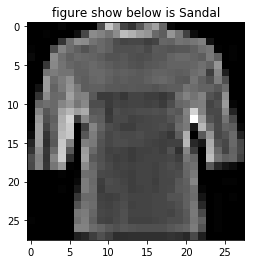

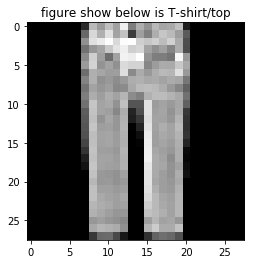

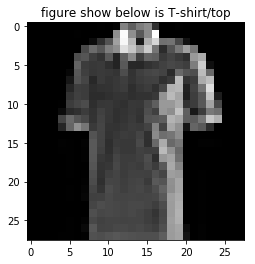

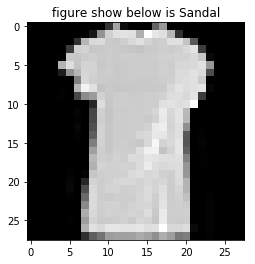

KeyboardInterrupt: 

In [251]:
import matplotlib.pyplot as plt
for index, row in ApparelTestData.iterrows():#.loc[0:20,:]
    #for j in ApparelDataSample.columns:
    label = row[0]
    pixels = row[1:]
    # Make those columns into a array of 8-bits pixels
    # This array will be of 1D with length 784
    # The pixel intensity values are integers from 0 to 255
    pixels = np.array(pixels, dtype='uint8')
    # Reshape the array into 28 x 28 array (2-dimensional array)
    pixels = pixels.reshape((28,28))
    plt.title('figure show below is {label}'.format(label=EncodedLabel[label]))
    plt.imshow(pixels, cmap='gray')
    plt.show()
    #break

In [5]:
class Neural_Network(object):
    def __init__(object,inputLayerSize,outputLayerSize,hiddenLayerSize):
        self.inputLayerSize = inputLayerSize
        self.outputLayerSize = outputLayerSize
        self.hiddenLayerSize = hiddenLayerSize
    def costFunction(X,y):
        return cost
    def 
        

In [114]:
A = np.array([[1,2],[3,4]])
print(A)
print(np.sum(A, axis=0))
print(type(np.sum(A, axis=0)))
#print(np.array([np.sum(A, axis=0)]))
B= A/np.sum(A, axis=0)[None,:]
B

[[1 2]
 [3 4]]
[4 6]
<class 'numpy.ndarray'>


array([[0.25      , 0.33333333],
       [0.75      , 0.66666667]])

In [111]:
A = np.zeros((3,)*2)
A[1][2] = 5
A[2][1] = 4

(1./(1+np.exp(-1*A)))


array([[0.5       , 0.5       , 0.5       ],
       [0.5       , 0.5       , 0.99330715],
       [0.5       , 0.98201379, 0.5       ]])

In [138]:
a=np.array([0,5,3,9,7,4]) 
b=np.array([0,1,2,3,4,5,6,7,8,9])
(a[:,None]==b).astype(int)

array([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]])

In [ ]:
weightsVector = Neural_Network

In [152]:
for i in range(5,-1,-1):
    print(i)

5
4
3
2
1
0


In [108]:
np.random.uniform(size=(2,2))

array([[0.1490503 , 0.37433696],
       [0.09315565, 0.66796135]])